In [1]:
#主要是用于数据处理、可视化、建模、评分等
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 32)

# 可视化
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
import plotly.express as px
%matplotlib inline

# 缺失值可视化
import missingno as msno
# 地图可视化
import folium
from folium.plugins import HeatMap

# 建模相关
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, recall_score, roc_auc_score, precision_score, f1_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

# 忽略警告
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('hotel_bookings.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [3]:
# 1、字段信息

df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

字段的具体中文含义：

hotel 酒店

is_canceled 是否取消

lead_time 预订时间

arrival_date_year 入住年份

arrival_date_month 入住月份

arrival_date_week_number 入住周次

arrival_date_day_of_month 入住天号

stays_in_weekend_nights 周末夜晚数

stays_in_week_nights 工作日夜晚数
adults 成人数量

children 儿童数量

babies 幼儿数量

meal 餐食

country 国家

market_segment 细分市场

distribution_channel 分销渠道

is_repeated_guest 是否是回头客

previous_cancellations 先前取消数

previous_bookings_not_canceled 先前未取消数

reserved_room_type 预订房间类型

assigned_room_type 实际房间类型

booking_changes 预订更改数

deposit_type 押金方式

agent 代理

company 公司

days_in_waiting_list 排队天数

customer_type 客户类型

adr 每日房间均价 （Average Daily Rate）

required_car_parking_spaces 停车位数量

total_of_special_requests 特殊需求数(例如高层或双床)

reservation_status 订单状态

reservation_status_date 订单状态确定日期

In [4]:
# 2、总字段个数
len(df.columns)

32

In [5]:
# 3、字段类型
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [6]:
# 4、不同类型字段统计
df.dtypes.value_counts()

int64      16
object     12
float64     4
dtype: int64

In [7]:
# 5、数据量
df.shape

(119390, 32)

In [8]:
# 6、描述统计信息
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [9]:
# 7、数据完整信息
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

### 缺失值信息

#### 统计每个字段缺失值信息

统计每个字段的缺失值数量及比例

In [10]:
null_df = pd.DataFrame({"Null Values": df.isnull().sum(),
                         "Percentage Null Values": (df.isnull().sum()) / (df.shape[0]) * 100
                         })

null_df

,Null Values,Percentage Null Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


### 缺失值可视化
#### 将缺失值信息进行可视化展示：

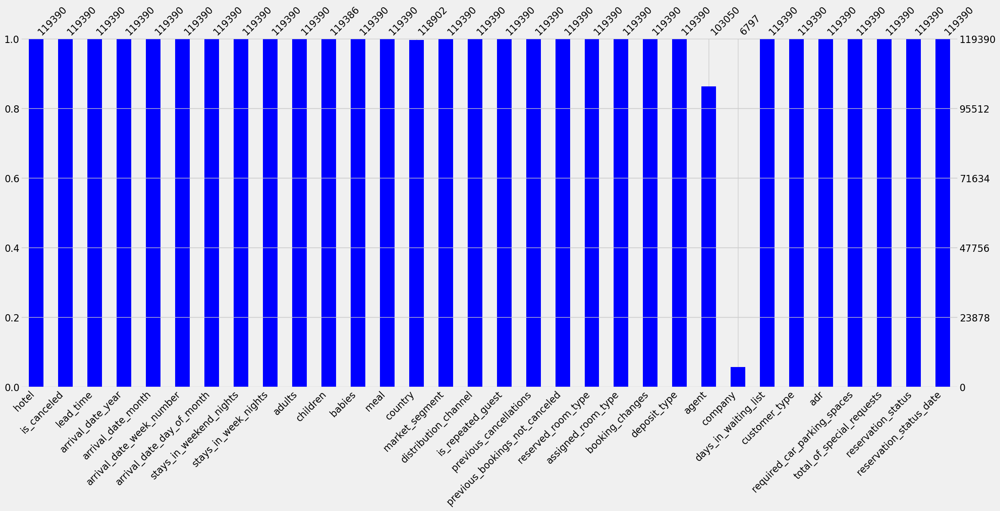

In [11]:
msno.bar(df, color="blue")

plt.show()

缺失值处理

1、字段 children和字段country 缺失值比例都不到1%，比例很小；我们直接把缺失值的部分删除

In [12]:
# 把非缺失值的数据筛选出来

df = df[df["country"].isnull() == False]
df = df[df["children"].isnull() == False]

df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


2、字段company缺失值比例高达94.3%，我们考虑直接删除该字段：

In [13]:
df.drop("company", axis=1, inplace=True)

3、字段agent(代理商费用)的缺失值为13.68%，处理为：

In [14]:
# 1、先查看字段具体信息
df["agent"].value_counts()

9.0      31959
240.0    13871
1.0       7191
14.0      3638
7.0       3539
         ...  
70.0         1
93.0         1
54.0         1
497.0        1
59.0         1
Name: agent, Length: 332, dtype: int64

我们可以考虑使用的值来进行填充，比如：

0：无法确定缺失值的具体数据

9：众数

均值：字段现有值的均值

在这里我们考虑使用0来进行填充：

In [15]:
df["agent"].fillna(0,inplace=True)

### 特殊处理

处理1：入住人数不能为0

考虑到一个房间中adults、children和babies的数量不能同时为0：|

In [16]:
special = (df["children"] == 0) & (df.adults == 0) & (df.babies == 0)
special.head()

0    False
1    False
2    False
3    False
4    False
dtype: bool

In [17]:
# 排除特殊情况
df = df[~special]

### 处理2：adr（日均价）

取值不能为负数

最大值为5400，可以判断属于异常值

In [18]:
df["adr"].value_counts().sort_index()

-6.38          1
 0.00       1799
 0.26          1
 0.50          1
 1.00         14
            ... 
 450.00        1
 451.50        1
 508.00        1
 510.00        1
 5400.00       1
Name: adr, Length: 8857, dtype: int64

In [19]:
#通过小提琴图来查看数据的分布情况：处理前明显有离群点
px.violin(y=df["adr"])   # 处理前

In [20]:
px.box(df,y="adr")

In [21]:
# 删除大于1000的信息  df = df.drop(df[df.adr >1000].index)

df = df[(df["adr"] >= 0) & (df["adr"] < 5400)]  # 排除异常值

In [22]:
px.violin(y=df["adr"])  # 删除后

In [23]:
px.box(df,y="adr",color="hotel")   # 删除后

## 数据EDA-Exploratory Data Analysis
### 取消和未取消的顾客数对比

In [24]:
df["is_canceled"].value_counts()

0    74589
1    44137
Name: is_canceled, dtype: int64

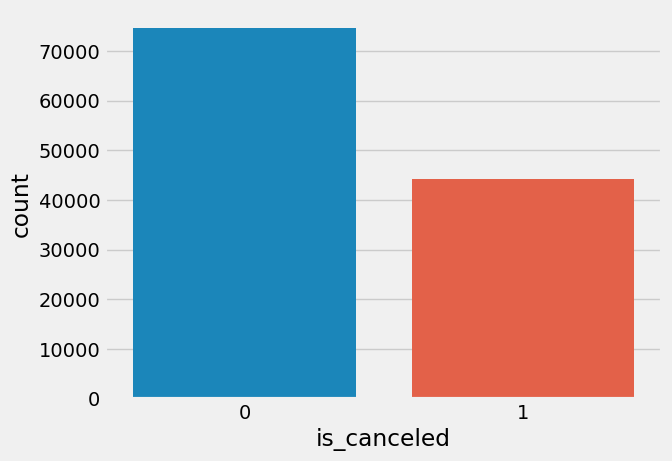

In [25]:
# 取消和未取消人数对比  0-未取消 1-取消
sns.countplot(df["is_canceled"])

plt.show()

In [26]:
#未取消的顾客来自哪里？
data = df[df.is_canceled == 0]  # 未取消的数据

In [27]:
number_no_canceled = data["country"].value_counts().reset_index()
number_no_canceled.columns = ["country", "number_of_no_canceled"]

number_no_canceled

,country,number_of_no_canceled
0,PRT,20977
1,GBR,9667
2,FRA,8468
3,ESP,6383
4,DEU,6067
...,...,...
160,BHR,1
161,DJI,1
162,MLI,1
163,NPL,1


In [28]:
# 地图可视化

basemap = folium.Map()
guests_map = px.choropleth(number_no_canceled, # 传入数据
                           locations = number_no_canceled['country'],  # 地理位置
                           color = number_no_canceled['number_of_no_canceled'],  # 颜色取值
                           hover_name = number_no_canceled['country'])  # 悬停信息
guests_map.show()

### 结论1：预订的顾客主要是来自Portugal，大部分是欧洲的国家

In [29]:
#房间的每日均价是多少？

px.box(data,  # 数据
       x="reserved_room_type",  # x
       y="adr", # y
       color="hotel",  # 颜色
       template="plotly_dark",  # 主题
       category_orders={"reserved_room_type":["A","B","C","D","E","F","G","H","L"]} # 指定排列顺序
      )

### 结论2：每个房间的均价还是取决于它的类型和标准差

全年每晚的价格是多少？

两种不同类型酒店的全年均价变化

In [30]:
data_resort = data[data["hotel"] == "Resort Hotel"]
data_city = data[data["hotel"] == "City Hotel"]

In [31]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel = data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,111.962267
1,August,118.674598
2,December,88.401855
3,February,86.520062
4,January,82.330983
5,July,115.818019
6,June,117.874360
7,March,90.658533
8,May,120.669827
9,November,86.946178


In [32]:
# 合并两个数据

total_hotel = pd.merge(resort_hotel, city_hotel,
                        on="arrival_date_month"
                        )
total_hotel.columns = ["month","price_resort","price_city"]
total_hotel

,month,price_resort,price_city
0,April,76.176140,111.962267
1,August,181.348715,118.674598
2,December,68.634584,88.401855
3,February,54.468180,86.520062
4,January,48.994018,82.330983
5,July,150.483553,115.818019
6,June,108.133154,117.874360
7,March,57.433661,90.658533
8,May,76.734804,120.669827
9,November,48.882907,86.946178


为了让月份按照正常时间排序，安装两个包：

jupyter notebook直接安装：前面要加!

In [33]:
#!pip install sort-dataframeby-monthorweek
#!pip install sorted-months-weekdays

In [34]:
import sort_dataframeby_monthorweek as sd

#  自定义排序函数
def sort_month(df, column):
    result = sd.Sort_Dataframeby_Month(df,column)
    return result

In [35]:
new_total_hotel = sort_month(total_hotel, "month")
new_total_hotel

,month,price_resort,price_city
0,January,48.994018,82.330983
1,February,54.468180,86.520062
2,March,57.433661,90.658533
3,April,76.176140,111.962267
4,May,76.734804,120.669827
5,June,108.133154,117.874360
6,July,150.483553,115.818019
7,August,181.348715,118.674598
8,September,96.288897,112.776582
9,October,61.932777,102.004672


In [36]:
fig = px.line(new_total_hotel,
        x = "month",
        y = ["price_resort", "price_city"],
        title = "Price of per night over the Months",
        template = "plotly_dark"      
       )

fig.show()

### 结论：

Resort Hotel在夏季的价格明显比 City Hotel的价格高

City Hotel的价格变化相对更小。但是City Hotel的价格从4月开始就已经很高，一直持续到9月份

### KDE图

KDE(Kernel Density Estimation，核密度图)，可以认为是对直方图的加窗平滑。通过KDE分布图场内看数据在不同情形下的分布

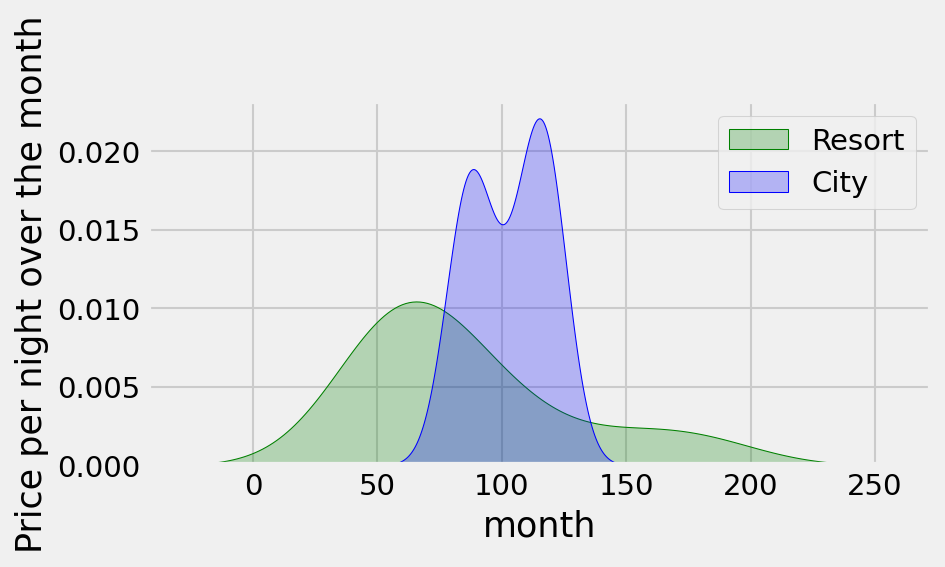

In [37]:
plt.figure(figsize=(6,3), dpi=150)

ax = sns.kdeplot(new_total_hotel["price_resort"], 
                 color="green", 
                 shade=True)

ax = sns.kdeplot(new_total_hotel["price_city"], 
                 color="blue", 
                 shade=True)

ax.set_xlabel("month")
ax.set_ylabel("Price per night over the month")
ax = ax.legend(["Resort","City"])

### 最为繁忙的季节-the most busy months

In [38]:
resort_guests = data_resort['arrival_date_month'].value_counts().reset_index()
resort_guests.columns=['Month','No_Resort_Guests']

city_guests = data_city['arrival_date_month'].value_counts().reset_index()
city_guests.columns=['Month','No_City_Guests']

# 合并两份DataFrame
final_guests = pd.merge(resort_guests, city_guests)

In [39]:
#同样的将月份进行排序处理
new_final_guests = sort_month(final_guests, "Month")
new_final_guests

,Month,No_Resort_Guests,No_City_Guests
0,January,1812,2249
1,February,2253,3051
2,March,2516,4049
3,April,2518,4010
4,May,2523,4568
5,June,2026,4358
6,July,3110,4770
7,August,3237,5367
8,September,2077,4283
9,October,2528,4326


In [40]:
fig = px.line(new_final_guests,
        x = "Month",
        y = ["No_Resort_Guests", "No_City_Guests"],
        title = "No of per Month",
        template = "plotly_dark"      
       )

fig.show()

### 结论：

很明显：City Hotel的人数是高于Resort Hotel，更受欢迎

City Hotel在7-8月份的时候，尽管价格高（上图），但人数也达到了峰值

两个Hotel在冬季的顾客都是很少的

### 顾客停留多久？

In [41]:
data["total_nights"] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_nights
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.0,0,1,Check-Out,2015-07-03,2


In [42]:
#两个不同酒店在不同停留时间下的统计：

stay_groupby = (data.groupby(['total_nights', 'hotel'])["is_canceled"]
                .agg("count")
                .reset_index()
                .rename(columns={"is_canceled":"Number of stays"}))

stay_groupby.head()

,total_nights,hotel,Number of stays
0,0,City Hotel,251
1,0,Resort Hotel,366
2,1,City Hotel,9155
3,1,Resort Hotel,6368
4,2,City Hotel,10983


In [43]:
stay_groupby = (data.groupby(['total_nights', 'hotel'])["is_canceled"]
                .agg("count")
                .reset_index()
                .rename(columns={"is_canceled":"Number of stays"}))

stay_groupby.head()

,total_nights,hotel,Number of stays
0,0,City Hotel,251
1,0,Resort Hotel,366
2,1,City Hotel,9155
3,1,Resort Hotel,6368
4,2,City Hotel,10983


In [44]:
fig = px.bar(stay_groupby,
       x = "total_nights",
       y = "Number of stays",
       color = "hotel",
       barmode = "group"
      )

fig.show()

### 数据预处理-Data Pre Processing
### 相关性判断

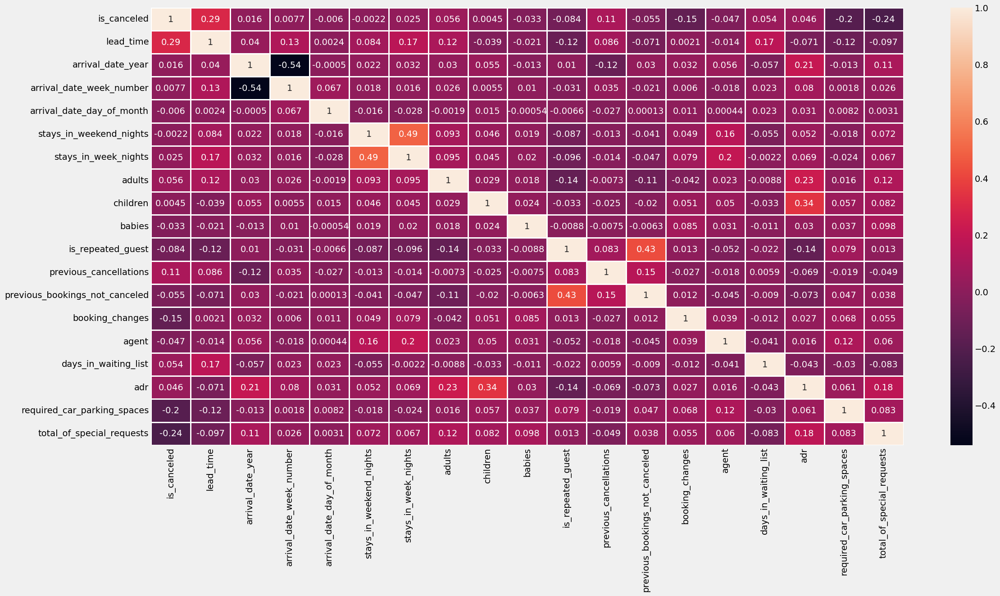

In [45]:
plt.figure (figsize=(24,12))

corr = df.corr()
sns.heatmap(corr, annot = True, linewidths = 1)
plt.show()

In [46]:
#查看每个特征和目标变量is_canceled的相关系数的绝对值，并降序排列：
corr_with_iscanceled = df.corr()["is_canceled"].abs().sort_values(ascending=False)

corr_with_iscanceled

is_canceled                       1.000000
lead_time                         0.291619
total_of_special_requests         0.235923
required_car_parking_spaces       0.195013
booking_changes                   0.145139
previous_cancellations            0.109911
is_repeated_guest                 0.084115
adults                            0.056129
previous_bookings_not_canceled    0.055494
days_in_waiting_list              0.054114
agent                             0.046842
adr                               0.045910
babies                            0.032605
stays_in_week_nights              0.024825
arrival_date_year                 0.016419
arrival_date_week_number          0.007668
arrival_date_day_of_month         0.006022
children                          0.004536
stays_in_weekend_nights           0.002192
Name: is_canceled, dtype: float64

In [47]:
#删除无效字段
no_use_col = ['arrival_date_year', 'assigned_room_type',
             'booking_changes','reservation_status', 
             'country', 'days_in_waiting_list']

In [48]:
df.drop(no_use_col, axis=1, inplace=True)

### 特征工程

离散型变量处理

In [49]:
df["hotel"].dtype # Series型数据的字段类型

dtype('O')

In [50]:
cat_cols = [col for col in df.columns if df[col].dtype == "O"]
cat_cols

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status_date']

In [51]:
cat_df = df[cat_cols]

In [52]:
cat_df.dtypes

hotel                      object
arrival_date_month         object
meal                       object
market_segment             object
distribution_channel       object
reserved_room_type         object
deposit_type               object
customer_type              object
reservation_status_date    object
dtype: object

In [53]:
# 1、转成时间类型数据

cat_df['reservation_status_date'] = pd.to_datetime(cat_df['reservation_status_date'])

In [54]:
#  2、提取年月日

cat_df["year"] = cat_df['reservation_status_date'].dt.year
cat_df['month'] = cat_df['reservation_status_date'].dt.month
cat_df['day'] = cat_df['reservation_status_date'].dt.day

In [55]:
# 3、删除无效字段
cat_df.drop(['reservation_status_date','arrival_date_month'], axis=1, inplace=True)

In [56]:
# 4、每个字段的唯一值

for col in cat_df.columns:
    print(f"{col}: \n{cat_df[col].unique()}\n")


hotel: 
['Resort Hotel' 'City Hotel']

meal: 
['BB' 'FB' 'HB' 'SC' 'Undefined']

market_segment: 
['Direct' 'Corporate' 'Online TA' 'Offline TA/TO' 'Complementary' 'Groups'
 'Aviation']

distribution_channel: 
['Direct' 'Corporate' 'TA/TO' 'Undefined' 'GDS']

reserved_room_type: 
['C' 'A' 'D' 'E' 'G' 'F' 'H' 'L' 'B']

deposit_type: 
['No Deposit' 'Refundable' 'Non Refund']

customer_type: 
['Transient' 'Contract' 'Transient-Party' 'Group']

year: 
[2015 2014 2016 2017]

month: 
[ 7  5  4  6  3  8  9  1 11 10 12  2]

day: 
[ 1  2  3  6 22 23  5  7  8 11 16 29 19 18  9 13  4 12 26 17 15 10 20 14
 30 28 25 21 27 24 31]



### 特征编码

In [57]:
# 酒店
cat_df['hotel'] = cat_df['hotel'].map({'Resort Hotel' : 0, 
                                       'City Hotel' : 1})
# 餐食
cat_df['meal'] = cat_df['meal'].map({'BB' : 0, 
                                     'FB': 1, 
                                     'HB': 2, 
                                     'SC': 3, 
                                     'Undefined': 4})
# 细分市场
cat_df['market_segment'] = (cat_df['market_segment']
                            .map({'Direct': 0,
                                 'Corporate':1,
                                 'Online TA':2, 
                                 'Offline TA/TO': 3,
                                 'Complementary': 4,
                                 'Groups': 5,
                                 'Undefined': 6,
                                 'Aviation': 7}))
# 分销渠道
cat_df['distribution_channel'] = (cat_df['distribution_channel']
                                  .map({'Direct': 0,
                                        'Corporate': 1,
                                        'TA/TO': 2, 
                                        'Undefined': 3,
                                        'GDS': 4}))
# 预订房间类型
cat_df['reserved_room_type'] = (cat_df['reserved_room_type']
                                .map({'C': 0, 
                                      'A': 1, 
                                      'D': 2, 
                                      'E': 3, 
                                      'G': 4, 
                                      'F': 5, 
                                      'H': 6,
                                      'L': 7, 
                                      'B': 8}))
# 押金方式
cat_df['deposit_type'] = (cat_df['deposit_type']
                          .map({'No Deposit': 0, 
                                'Refundable': 1, 
                                'Non Refund': 3}))
# 顾客类型
cat_df['customer_type'] = (cat_df['customer_type']
                           .map({'Transient': 0, 
                                 'Contract': 1, 
                                 'Transient-Party': 2, 
                                 'Group': 3})
                          )
# 年份
cat_df['year'] = cat_df['year'].map({2015: 0, 2014: 1, 2016: 2, 2017: 3})

### 连续型变量处理

In [58]:
num_df = df.drop(columns=cat_cols,axis=1)

num_df.drop("is_canceled",axis=1,inplace=True)

In [59]:
# 方差偏大的字段进行对数化处理
log_col = ["lead_time","arrival_date_week_number","arrival_date_day_of_month","agent","adr"]

for col in log_col:
    num_df[col] = np.log(num_df[col] + 1)
    
num_df.head()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,adr,required_car_parking_spaces,total_of_special_requests
0,5.837730,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.000000,0,0
1,6.603944,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.000000,0,0
2,2.079442,3.332205,0.693147,0,1,1,0.0,0,0,0,0,0.000000,4.330733,0,0
3,2.639057,3.332205,0.693147,0,1,1,0.0,0,0,0,0,5.720312,4.330733,0,0
4,2.708050,3.332205,0.693147,0,2,2,0.0,0,0,0,0,5.484797,4.595120,0,1


### 建模
### 合并两份df

In [60]:
X = pd.concat([cat_df, num_df], axis=1)
y = df["is_canceled"]

In [61]:
print(X.shape)
print(y.shape)

(118726, 25)
(118726,)


In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,random_state=412)

### 建模1：逻辑回归

In [63]:
# 模型实例化
lr = LogisticRegression()
lr.fit(X_train, y_train)

# 预测值
y_pred_lr = lr.predict(X_test)

# 分类问题不同评价指标
acc_lr = accuracy_score(y_test, y_pred_lr)
conf = confusion_matrix(y_test, y_pred_lr)
clf_report = classification_report(y_test, y_pred_lr)

print(f"Accuracy Score of Logistic Regression is : {acc_lr}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Logistic Regression is : 0.8134843763160111
Confusion Matrix : 
[[14172   797]
 [ 3632  5145]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.80      0.95      0.86     14969
           1       0.87      0.59      0.70      8777

    accuracy                           0.81     23746
   macro avg       0.83      0.77      0.78     23746
weighted avg       0.82      0.81      0.80     23746



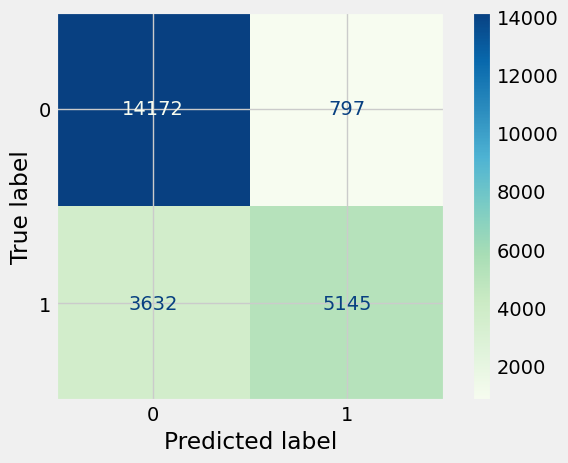

In [64]:
# 混淆矩阵可视化

classes = ["0","1"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf, display_labels=classes)
disp.plot(
    include_values=True,            # 混淆矩阵每个单元格上显示具体数值
    cmap="GnBu",                 # matplotlib识别的颜色图
    ax=None,
    xticks_rotation="horizontal",
    values_format="d"
)

plt.show()

In [65]:
#KNN 模型
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

y_pred= knn.predict(X_test)

acc_knn = accuracy_score(y_test, y_pred)
conf = confusion_matrix(y_test, y_pred)
clf_report = classification_report(y_test, y_pred)

In [66]:
#决策树模型
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

y_pred_dtc = dtc.predict(X_test)

acc_dtc = accuracy_score(y_test, y_pred_dtc)
conf = confusion_matrix(y_test, y_pred_dtc)
clf_report = classification_report(y_test, y_pred_dtc)

In [67]:
#随机森林
rd_clf = RandomForestClassifier()
rd_clf.fit(X_train, y_train)

y_pred_rd_clf = rd_clf.predict(X_test)

acc_rd_clf = accuracy_score(y_test, y_pred_rd_clf)
conf = confusion_matrix(y_test, y_pred_rd_clf)
clf_report = classification_report(y_test, y_pred_rd_clf)

In [68]:
#Adaboost模型
ada = AdaBoostClassifier(base_estimator = dtc)
ada.fit(X_train, y_train)

y_pred_ada = ada.predict(X_test)

acc_ada = accuracy_score(y_test, y_pred_ada)
conf = confusion_matrix(y_test, y_pred_ada)
clf_report = classification_report(y_test, y_pred_ada)

In [69]:
#梯度提升树-Gradient Boosting Classifier
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

y_pred_gb = gb.predict(X_test)

acc_gb = accuracy_score(y_test, y_pred_gb)
conf = confusion_matrix(y_test, y_pred_gb)
clf_report = classification_report(y_test, y_pred_gb)

In [70]:
#XGBoost模型
xgb = XGBClassifier(booster='gbtree', 
                    learning_rate=0.1, 
                    max_depth=5, 
                    n_estimators=180)

xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

acc_xgb = accuracy_score(y_test, y_pred_xgb)
conf = confusion_matrix(y_test, y_pred_xgb)
clf_report = classification_report(y_test, y_pred_xgb)

In [71]:
#CatBoost 模型
cat = CatBoostClassifier(iterations=100)
cat.fit(X_train, y_train)

y_pred_cat = cat.predict(X_test)

acc_cat = accuracy_score(y_test, y_pred_cat)
conf = confusion_matrix(y_test, y_pred_cat)
clf_report = classification_report(y_test, y_pred_cat)

Learning rate set to 0.5
0:	learn: 0.4751764	total: 156ms	remaining: 15.5s
1:	learn: 0.4103107	total: 168ms	remaining: 8.23s
2:	learn: 0.3533169	total: 183ms	remaining: 5.91s
3:	learn: 0.3290297	total: 191ms	remaining: 4.59s
4:	learn: 0.2719981	total: 200ms	remaining: 3.8s
5:	learn: 0.2492807	total: 209ms	remaining: 3.28s
6:	learn: 0.2152683	total: 217ms	remaining: 2.88s
7:	learn: 0.1919799	total: 224ms	remaining: 2.58s
8:	learn: 0.1776196	total: 231ms	remaining: 2.34s
9:	learn: 0.1654125	total: 238ms	remaining: 2.14s
10:	learn: 0.1555014	total: 244ms	remaining: 1.97s
11:	learn: 0.1452100	total: 250ms	remaining: 1.83s
12:	learn: 0.1381844	total: 256ms	remaining: 1.71s
13:	learn: 0.1327335	total: 262ms	remaining: 1.61s
14:	learn: 0.1276286	total: 269ms	remaining: 1.52s
15:	learn: 0.1220964	total: 274ms	remaining: 1.44s
16:	learn: 0.1148292	total: 281ms	remaining: 1.37s
17:	learn: 0.1117525	total: 286ms	remaining: 1.3s
18:	learn: 0.1047834	total: 292ms	remaining: 1.25s
19:	learn: 0.10068

In [72]:
#极端树-Extra Trees Classifier
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

y_pred_etc = etc.predict(X_test)

acc_etc = accuracy_score(y_test, y_pred_etc)
conf = confusion_matrix(y_test, y_pred_etc)
clf_report = classification_report(y_test, y_pred_etc)

In [73]:
#LGBM
lgbm = LGBMClassifier(learning_rate = 1)
lgbm.fit(X_train, y_train)

y_pred_lgbm = lgbm.predict(X_test)

acc_lgbm = accuracy_score(y_test, y_pred_lgbm)
conf = confusion_matrix(y_test, y_pred_lgbm)
clf_report = classification_report(y_test, y_pred_lgbm)

In [74]:
#模型11：投票分类器-Voting Classifier
#这个是重点建模：多分类器的投票表决

classifiers = [('Gradient Boosting Classifier', gb), 
               ('Cat Boost Classifier', cat), 
               ('XGboost', xgb),  
               ('Decision Tree', dtc),
               ('Extra Tree', etc), 
               ('Light Gradient', lgbm), 
               ('Random Forest', rd_clf), 
               ('Ada Boost', ada), 
               ('Logistic', lr),
               ('Knn', knn)]

vc = VotingClassifier(estimators = classifiers)
vc.fit(X_train, y_train)

y_pred_vc = vc.predict(X_test)

acc_vtc = accuracy_score(y_test, y_pred_vc)
conf = confusion_matrix(y_test, y_pred_vc)
clf_report = classification_report(y_test, y_pred_vc)

Learning rate set to 0.5
0:	learn: 0.4751764	total: 10.5ms	remaining: 1.04s
1:	learn: 0.4103107	total: 19.7ms	remaining: 964ms
2:	learn: 0.3533169	total: 28.4ms	remaining: 917ms
3:	learn: 0.3290297	total: 35.7ms	remaining: 857ms
4:	learn: 0.2719981	total: 43.2ms	remaining: 822ms
5:	learn: 0.2492807	total: 50.3ms	remaining: 788ms
6:	learn: 0.2152683	total: 57.8ms	remaining: 768ms
7:	learn: 0.1919799	total: 64.3ms	remaining: 739ms
8:	learn: 0.1776196	total: 70.6ms	remaining: 714ms
9:	learn: 0.1654125	total: 76.8ms	remaining: 691ms
10:	learn: 0.1555014	total: 82.8ms	remaining: 670ms
11:	learn: 0.1452100	total: 89.3ms	remaining: 655ms
12:	learn: 0.1381844	total: 95.4ms	remaining: 638ms
13:	learn: 0.1327335	total: 102ms	remaining: 625ms
14:	learn: 0.1276286	total: 108ms	remaining: 611ms
15:	learn: 0.1220964	total: 114ms	remaining: 599ms
16:	learn: 0.1148292	total: 120ms	remaining: 588ms
17:	learn: 0.1117525	total: 127ms	remaining: 577ms
18:	learn: 0.1047834	total: 133ms	remaining: 566ms
19:

### 基于深度学习keras建模
### 数据预处理和切割

In [75]:
from tensorflow.keras.utils import to_categorical

X = pd.concat([cat_df, num_df], axis = 1)
# 转成分类型变量数据
y = to_categorical(df['is_canceled'])

In [76]:
# 切割数据

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [77]:
import tensorflow as tf
import keras
from keras.layers import Dense
from keras.models import Sequential

In [78]:
X.shape[1]

25

In [79]:
model = Sequential()

model.add(Dense(100, activation="relu",input_shape=(X.shape[1], )))
model.add(Dense(100, activation="relu"))
model.add(Dense(2, activation="sigmoid"))

model.compile(optimizer="adam", 
              loss="binary_crossentropy",
              metrics=["accuracy"])

model_history = model.fit(X_train, 
                          y_train, 
                          validation_data = (X_test, y_test),
                          epochs = 50)

Epoch 1/50
2969/2969 [==============================] - 2s 657us/step - loss: 0.3324 - accuracy: 0.8631 - val_loss: 0.2052 - val_accuracy: 0.9319
Epoch 2/50
2969/2969 [==============================] - 2s 626us/step - loss: 0.1561 - accuracy: 0.9474 - val_loss: 0.1230 - val_accuracy: 0.9582
Epoch 3/50
2969/2969 [==============================] - 2s 610us/step - loss: 0.1179 - accuracy: 0.9615 - val_loss: 0.1209 - val_accuracy: 0.9629
Epoch 4/50
2969/2969 [==============================] - 2s 609us/step - loss: 0.0927 - accuracy: 0.9711 - val_loss: 0.0882 - val_accuracy: 0.9696
Epoch 5/50
2969/2969 [==============================] - 2s 625us/step - loss: 0.0804 - accuracy: 0.9752 - val_loss: 0.0815 - val_accuracy: 0.9717
Epoch 6/50
2969/2969 [==============================] - 2s 637us/step - loss: 0.0732 - accuracy: 0.9769 - val_loss: 0.0654 - val_accuracy: 0.9786
Epoch 7/50
2969/2969 [==============================] - 2s 612us/step - loss: 0.0645 - accuracy: 0.9800 - val_loss: 0.0523 -

In [80]:
#指标可视化-loss
train_loss = model_history.history["loss"]
val_loss = model_history.history["val_loss"]

epoch = range(1,51)

loss = pd.DataFrame({"train_loss": train_loss,
                     "val_loss":val_loss
                    })
loss.head()

,train_loss,val_loss
0,0.332411,0.205177
1,0.156089,0.123037
2,0.117903,0.120891
3,0.092652,0.088245
4,0.080399,0.081451


In [81]:
train_loss = model_history.history["loss"]
val_loss = model_history.history["val_loss"]

epoch = range(1,51)

loss = pd.DataFrame({"train_loss": train_loss,
                     "val_loss":val_loss
                    })
loss.head()

,train_loss,val_loss
0,0.332411,0.205177
1,0.156089,0.123037
2,0.117903,0.120891
3,0.092652,0.088245
4,0.080399,0.081451


In [82]:
fig = px.line(loss, 
        x=epoch, 
        y=['val_loss','train_loss'], 
        title='Train and Val Loss')

fig.show()

In [83]:
#指标可视化-acc
train_acc = model_history.history["accuracy"]
val_acc = model_history.history["val_accuracy"]

epoch = range(1,51)

acc = pd.DataFrame({"train_acc": train_acc,
                     "val_acc":val_acc
                    })

px.line(acc, 
        x=epoch, 
        y=['val_acc','train_acc'], 
        title = 'Train and Val Accuracy',
        template = 'plotly_dark')

In [84]:
#最终预测值

acc_ann = model.evaluate(X_test, y_test)[1]
acc_ann


743/743 [==============================] - 0s 439us/step - loss: 0.0233 - accuracy: 0.9928


0.9927566647529602

### 模型对比
#### 不同模型的结果对比

In [85]:
models = pd.DataFrame({
    'Model' : ['Logistic Regression', 'KNN', 
               'Decision Tree Classifier', 
               'Random Forest Classifier',
               'Ada Boost Classifier',
               'Gradient Boosting Classifier', 
               'XgBoost', 'Cat Boost', 
               'Extra Trees Classifier', 
               'LGBM', 'Voting Classifier','ANN'],
    'Score' : [acc_lr, acc_knn, acc_dtc, 
               acc_rd_clf, acc_ada, acc_gb, 
               acc_xgb, acc_cat, acc_etc, 
               acc_lgbm, acc_vtc, acc_ann]
})


models = models.sort_values(by = 'Score', ascending = True, ignore_index=True)

models["Score"] = models["Score"].apply(lambda x: round(x,4))
models

,Model,Score
0,Logistic Regression,0.8135
1,KNN,0.8962
2,Gradient Boosting Classifier,0.9183
3,Decision Tree Classifier,0.9513
4,Ada Boost Classifier,0.9513
5,Extra Trees Classifier,0.9538
6,Random Forest Classifier,0.9562
7,Voting Classifier,0.9672
8,LGBM,0.9740
9,XgBoost,0.9833


In [86]:
fig = px.bar(models,
       x="Score",
       y="Model",
       text="Score",
       color="Score",
       template="plotly_dark",
       title="Models Comparision"
      )

fig.show()

### 可以看到Cat Boost分类达到了惊人的99.61%